In [1]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.9/906.9 kB 16.8 MB/s eta 0:00:00a 0:00:01


In [2]:
import os
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import yaml

train_path = "/kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train"
val_path = "/kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val"

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
classes = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]

def load_data(data_path):
    images = []
    labels = []
    for class_label in classes:
        class_path = os.path.join(data_path, class_label, 'images')
        label_path = os.path.join(data_path, class_label, 'labels')
        for img_file in os.listdir(class_path):
            img = cv2.imread(os.path.join(class_path, img_file))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            label_file = img_file.replace('.jpg', '.txt')
            label_file_path = os.path.join(label_path, label_file)
            if os.path.exists(label_file_path):
                with open(label_file_path, 'r') as f:
                    label_data = f.readline().strip().split()
                    if len(label_data) > 0:
                        images.append(img)
                        labels.append(label_data)
                    else:
                        print(f"Label file {label_file_path} is empty, skipping this image.")
            else:
                print(f"Label file {label_file_path} not found, skipping this image.")
    return images, labels

train_images, train_labels = load_data(train_path)
val_images, val_labels = load_data(val_path)

Label file /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma/labels/gg (342).txt is empty, skipping this image.
Label file /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/No Tumor/labels/image(61).txt not found, skipping this image.
Label file /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/No Tumor/labels/image(55).txt not found, skipping this image.


In [5]:
dataset_yaml = {
    'path': '/kaggle/input/mri-for-brain-tumor-with-bounding-boxes',
    'train': 'Train',
    'val': 'Val',
    'names': classes
}

with open('/kaggle/working/dataset.yaml', 'w') as file:
    yaml.dump(dataset_yaml, file)

In [6]:
import numpy as np
def preprocess_images(images):
    processed_images = []
    for img in images:
        img_resized = cv2.resize(img, (640, 640))
        processed_images.append(img_resized)
    return np.array(processed_images)

train_images = preprocess_images(train_images)
val_images = preprocess_images(val_images)

In [7]:
model = YOLO("yolov8s.pt")

100%|██████████| 21.5M/21.5M [00:00<00:00, 184MB/s]


In [8]:
model.train(data='/kaggle/working/dataset.yaml', epochs=35, imgsz=640,patience=7)


Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/dataset.yaml, epochs=35, time=None, patience=7, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

100%|██████████| 755k/755k [00:00<00:00, 16.7MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 70.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train/Glioma/labels... 4737 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4737/4737 [00:09<00:00, 515.47it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train/Glioma is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma/labels... 510 images, 3 backgrounds, 0 corrupt: 100%|██████████| 512/512 [00:00<00:00, 615.14it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 35 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/35      4.11G      1.058      1.806      1.255          4        640: 100%|██████████| 297/297 [01:18<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.74it/s]

                   all        512        554      0.717      0.556      0.623      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/35      3.91G      1.065      1.113      1.234          1        640: 100%|██████████| 297/297 [01:17<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]

                   all        512        554      0.766      0.757      0.829      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/35      3.92G      1.064      1.051      1.235          5        640: 100%|██████████| 297/297 [01:16<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]

                   all        512        554      0.757      0.696       0.78      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/35      3.93G      1.035     0.9545      1.212          2        640: 100%|██████████| 297/297 [01:16<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]

                   all        512        554      0.871      0.789      0.865      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/35       4.1G      1.005     0.8869      1.195          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]

                   all        512        554       0.85      0.845       0.89      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/35      4.09G     0.9641     0.8399      1.171          0        640: 100%|██████████| 297/297 [01:16<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]

                   all        512        554      0.881      0.807      0.869      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/35      3.88G     0.9476     0.7852      1.159          2        640: 100%|██████████| 297/297 [01:16<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]

                   all        512        554      0.892       0.84      0.907      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/35      3.93G     0.9334      0.735      1.147          0        640: 100%|██████████| 297/297 [01:16<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]

                   all        512        554      0.934      0.837      0.927      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/35       4.1G     0.9214     0.7191      1.144          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]

                   all        512        554      0.919      0.878      0.939      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/35       4.1G     0.8943     0.6895      1.131          0        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]

                   all        512        554      0.917      0.891      0.938      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/35      3.88G     0.8891     0.6641      1.124          3        640: 100%|██████████| 297/297 [01:16<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]

                   all        512        554      0.879      0.876      0.939      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/35      4.11G     0.8734      0.649      1.116          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]

                   all        512        554      0.937      0.875      0.936      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/35       4.1G     0.8605     0.6222      1.117          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]

                   all        512        554      0.892      0.924      0.951      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/35      3.92G     0.8475     0.6162      1.105          2        640: 100%|██████████| 297/297 [01:16<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]

                   all        512        554      0.943      0.896      0.956      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/35      3.88G     0.8428     0.6018        1.1          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]

                   all        512        554      0.927      0.933       0.96      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/35      4.09G     0.8329     0.5805      1.087          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.81it/s]

                   all        512        554      0.929       0.92      0.952      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/35       4.1G     0.8341     0.5695      1.096          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]

                   all        512        554      0.934      0.915      0.957      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/35      4.08G     0.8105     0.5625      1.086          1        640: 100%|██████████| 297/297 [01:15<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]

                   all        512        554      0.938      0.922      0.956      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/35      4.05G     0.8046     0.5394      1.078          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]

                   all        512        554      0.949       0.91      0.958      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/35      4.11G      0.804     0.5345      1.081          1        640: 100%|██████████| 297/297 [01:15<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]

                   all        512        554      0.892       0.91      0.943      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/35      4.09G     0.7991     0.5215      1.075          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]

                   all        512        554      0.929      0.937      0.957      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/35      3.92G     0.7928     0.5125      1.071          2        640: 100%|██████████| 297/297 [01:16<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]

                   all        512        554      0.931      0.934      0.961      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/35      3.88G     0.7804     0.5053      1.066          2        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]

                   all        512        554      0.941      0.913      0.957      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/35       4.1G     0.7783     0.4925      1.062          2        640: 100%|██████████| 297/297 [01:15<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]

                   all        512        554      0.937      0.932      0.961      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/35      4.11G     0.7517     0.4782      1.054          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]

                   all        512        554      0.952      0.933      0.964      0.792


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/35      3.92G     0.7167     0.4262      1.029          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]

                   all        512        554      0.949      0.929      0.965      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/35      4.07G     0.7023      0.403      1.023          2        640: 100%|██████████| 297/297 [01:15<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]

                   all        512        554      0.969       0.92      0.965      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/35      4.11G     0.6896     0.3924      1.016          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.80it/s]

                   all        512        554      0.958      0.927      0.964      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/35      4.09G     0.6822     0.3791      1.013          1        640: 100%|██████████| 297/297 [01:15<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]

                   all        512        554      0.945      0.941      0.969        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/35      3.93G     0.6717     0.3714      1.005          2        640: 100%|██████████| 297/297 [01:15<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]

                   all        512        554      0.943      0.941      0.968        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/35      4.04G     0.6608     0.3572      0.996          1        640: 100%|██████████| 297/297 [01:15<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.63it/s]

                   all        512        554      0.951      0.938      0.967      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/35      4.09G      0.649     0.3502     0.9898          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.74it/s]

                   all        512        554       0.97      0.932      0.969      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/35      4.08G     0.6349     0.3331     0.9829          1        640: 100%|██████████| 297/297 [01:16<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]

                   all        512        554      0.966      0.933      0.968       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/35      4.08G     0.6316     0.3314      0.979          1        640: 100%|██████████| 297/297 [01:15<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]

                   all        512        554      0.965      0.936      0.968      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/35      4.05G     0.6191     0.3243     0.9691          1        640: 100%|██████████| 297/297 [01:15<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]

                   all        512        554      0.952      0.948       0.97      0.809



35 epochs completed in 0.793 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.16it/s]


                   all        512        554      0.966      0.933      0.968       0.81
                Glioma        135        153      0.958      0.869      0.958      0.798
            Meningioma        140        142      0.986      0.989      0.993      0.843
              No Tumor         98         98      0.978       0.99      0.977      0.835
             Pituitary        154        161      0.944      0.882      0.943      0.763
Speed: 0.2ms preprocess, 4.6ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c0343adf30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [9]:
metrics = model.val(split='val')

print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")    
print(f"Mean Average Precision @ .50   : {metrics.box.map50}") 
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")
print("recall : ",metrics.box.r)
print(metrics.box.f1)
print(metrics.box.maps)

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma/labels... 510 images, 3 backgrounds, 0 corrupt: 100%|██████████| 512/512 [00:00<00:00, 603.05it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma is not writeable, cache not saved.



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.41it/s]


                   all        512        554      0.966      0.933      0.968      0.811
                Glioma        135        153      0.958      0.869      0.958      0.796
            Meningioma        140        142      0.986      0.989      0.993      0.844
              No Tumor         98         98      0.978       0.99      0.977      0.842
             Pituitary        154        161      0.944      0.882      0.943      0.762
Speed: 0.2ms preprocess, 9.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train2
Mean Average Precision @.5:.95 : 0.8113606399578455
Mean Average Precision @ .50   : 0.9677988807455642
Mean Average Precision @ .70   : 0.9127232535938287
recall :  [    0.86928     0.98903      0.9898     0.88199]
[     0.9113     0.98749     0.98388     0.91193]
[    0.79641     0.84442     0.84231     0.76231]


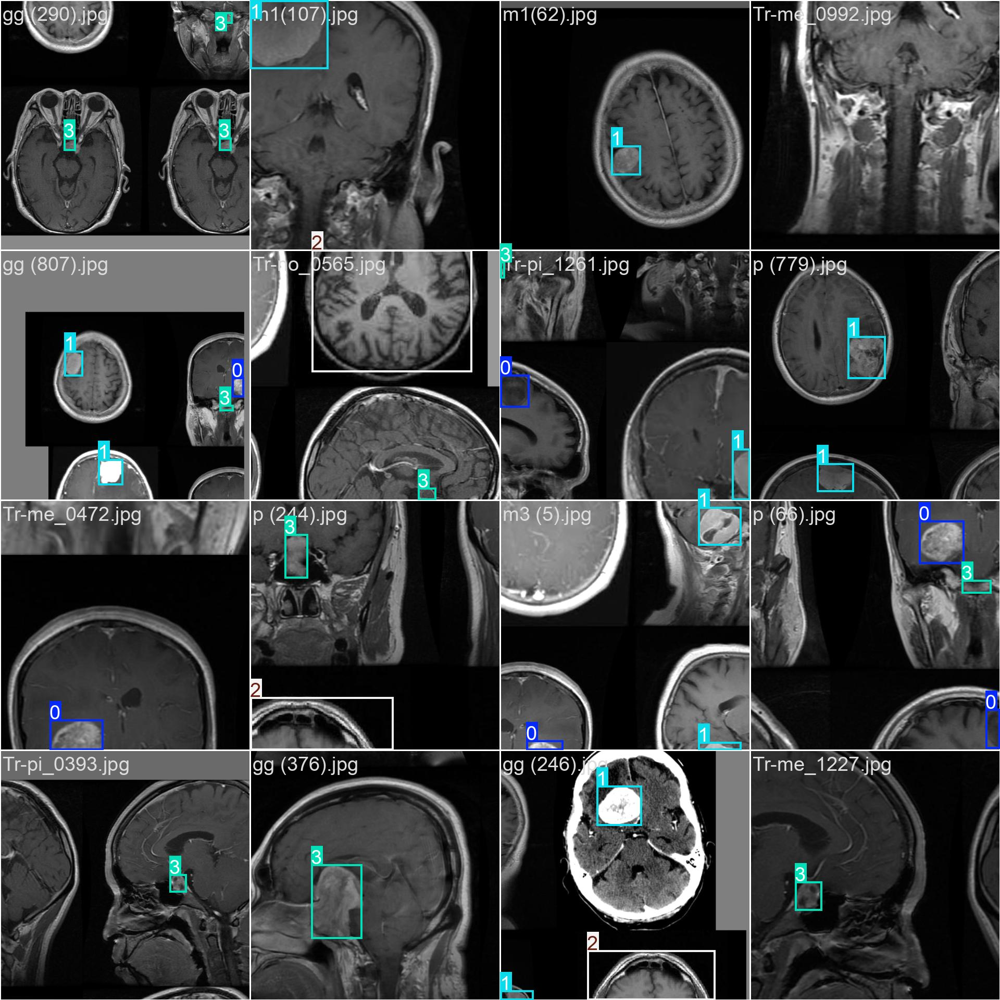

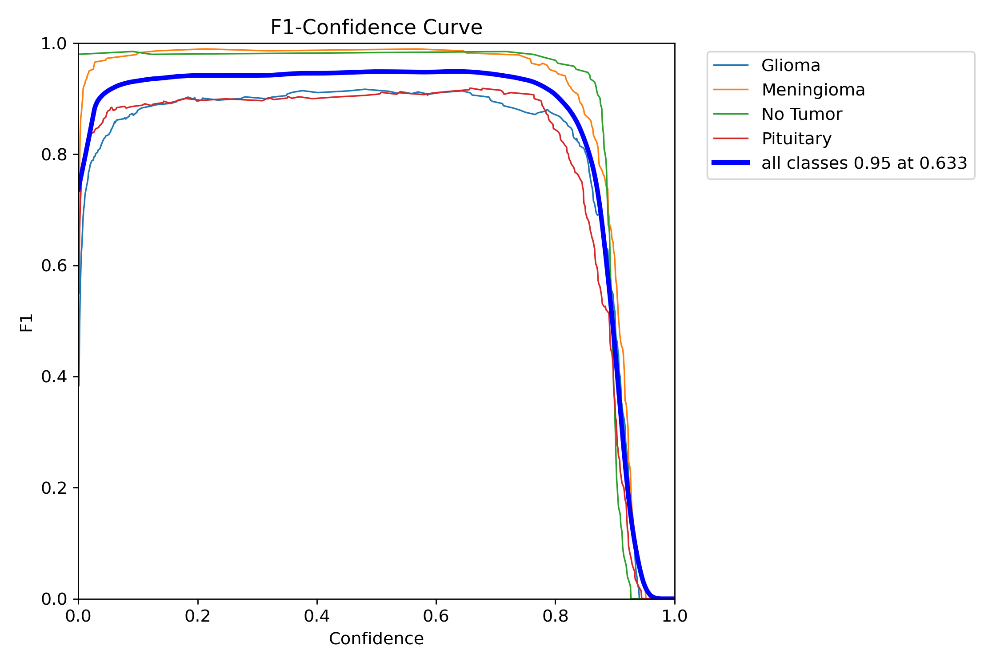

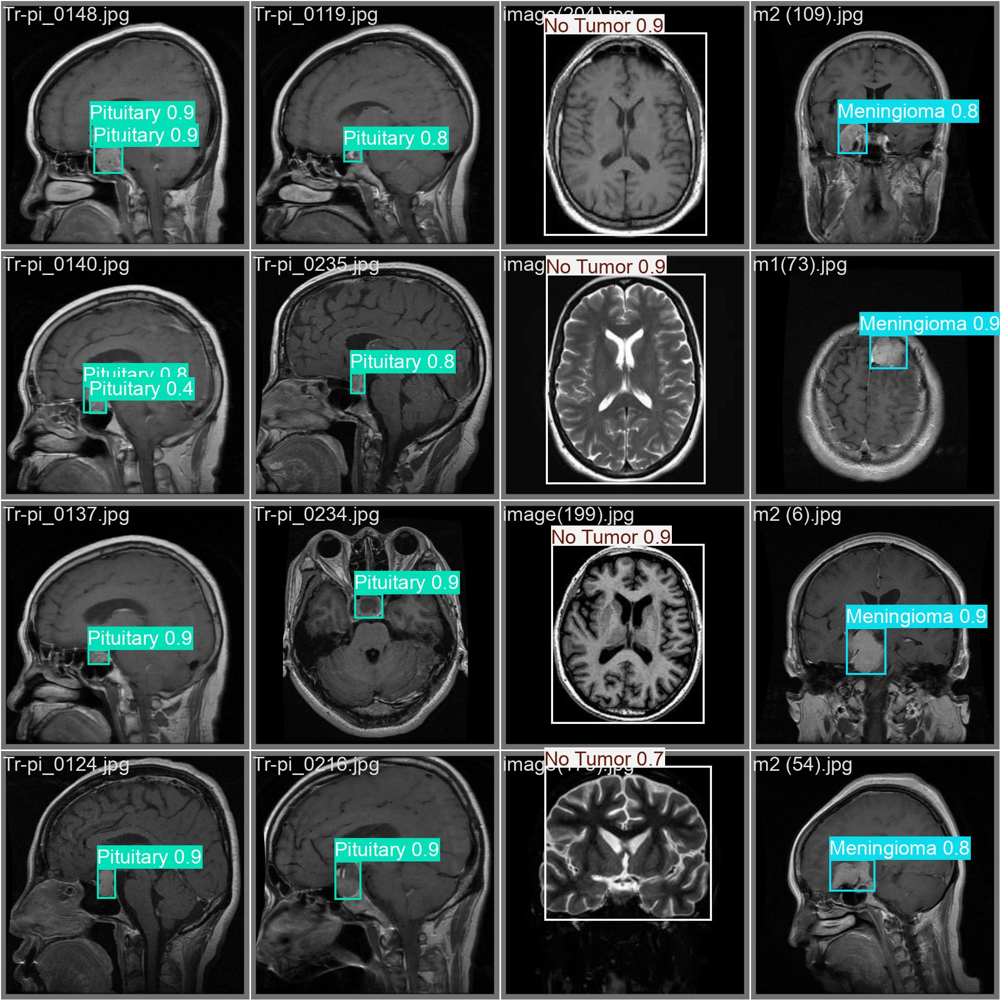

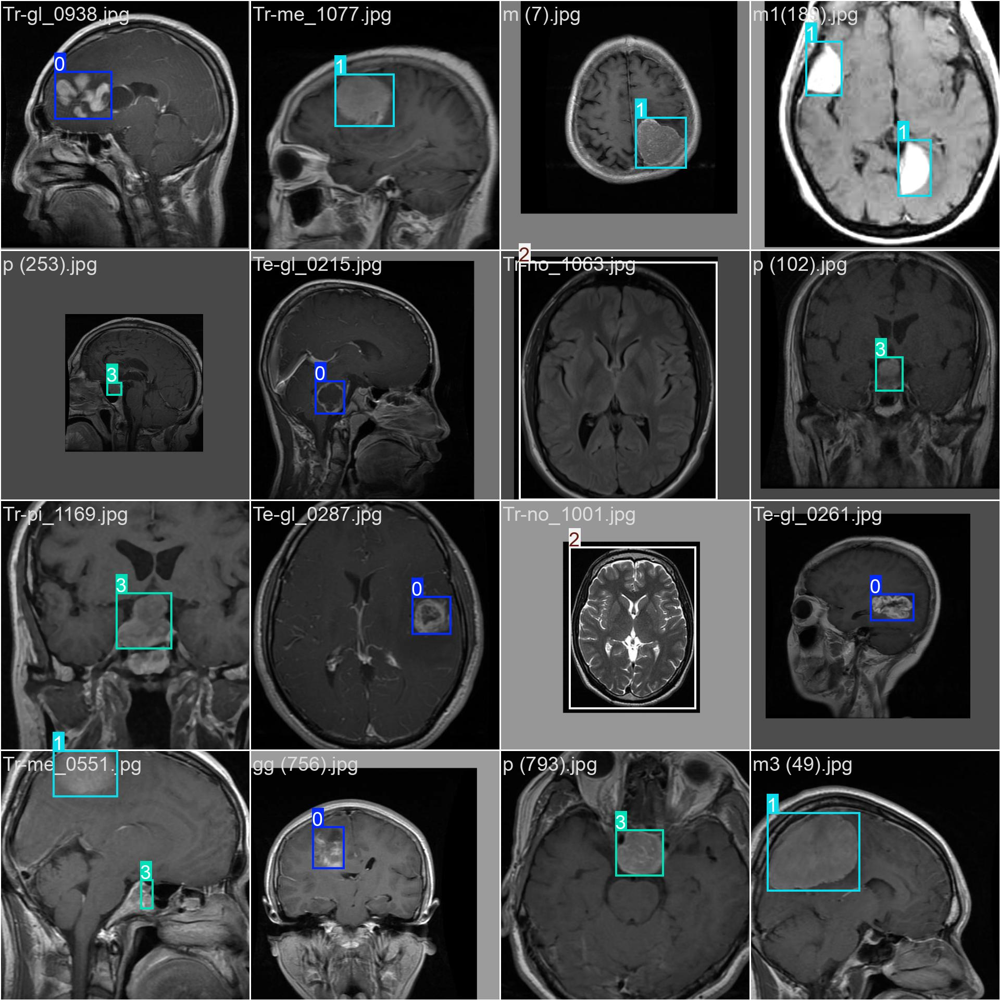

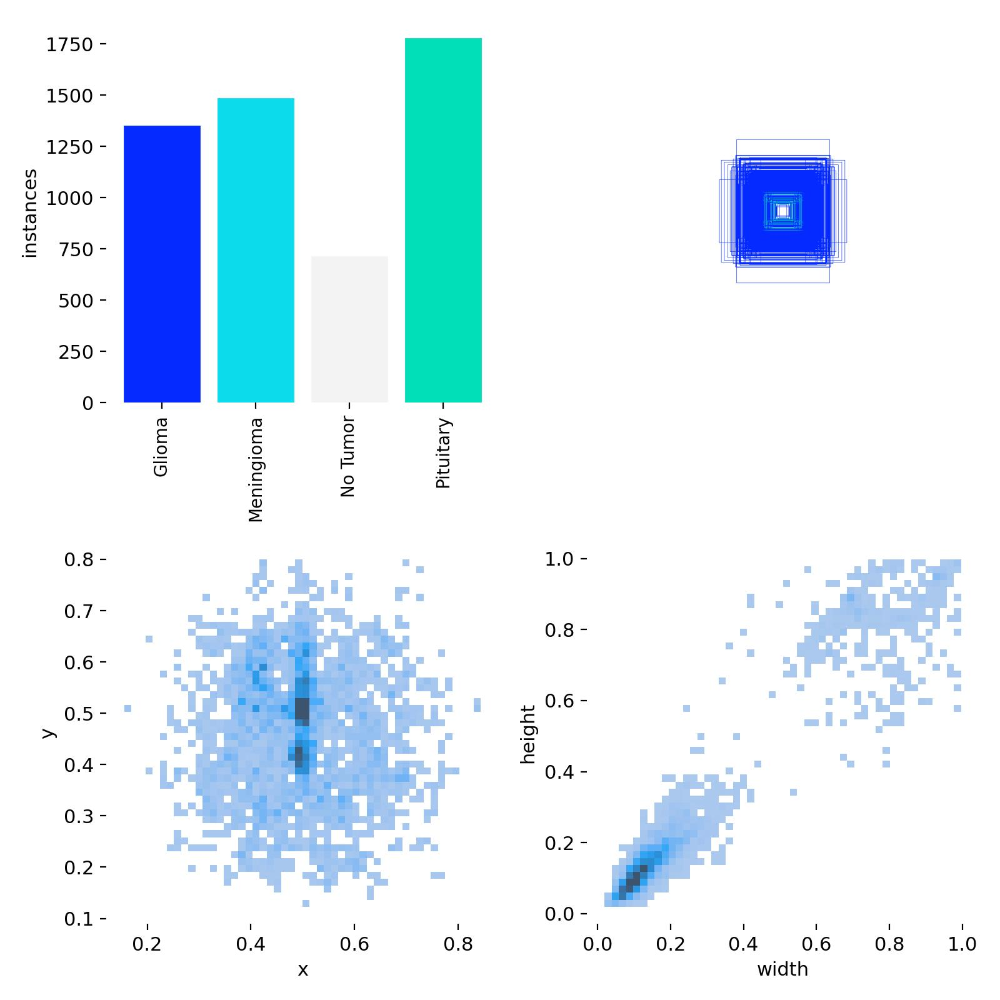

...

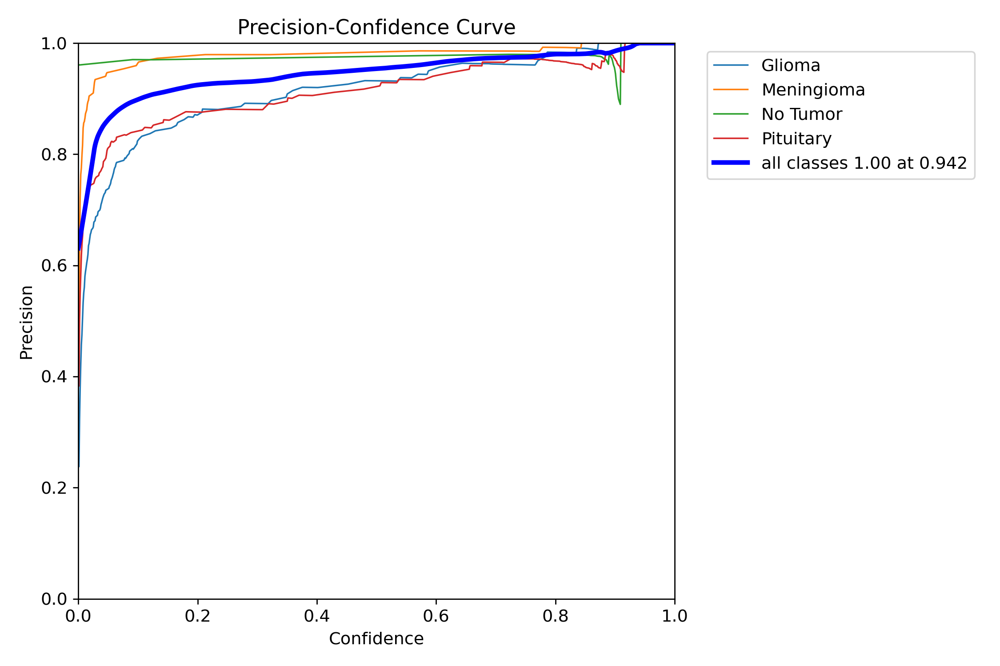

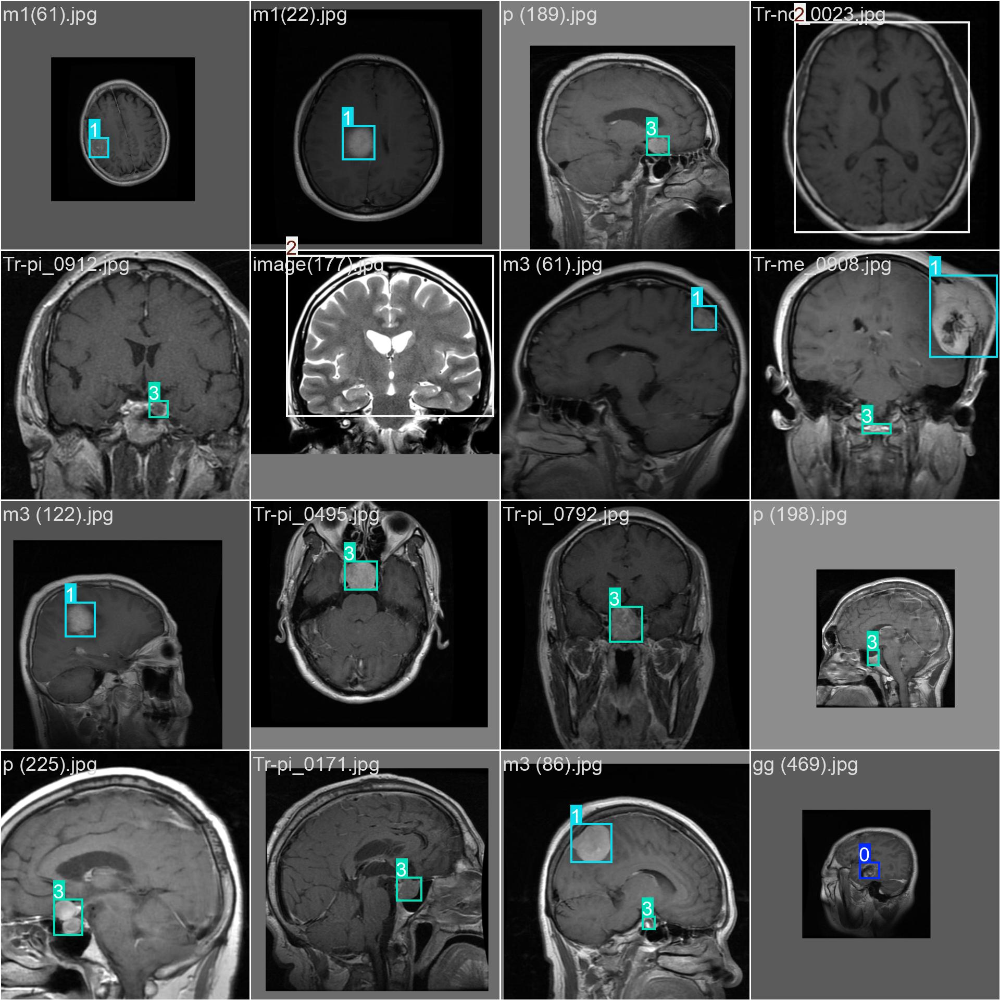

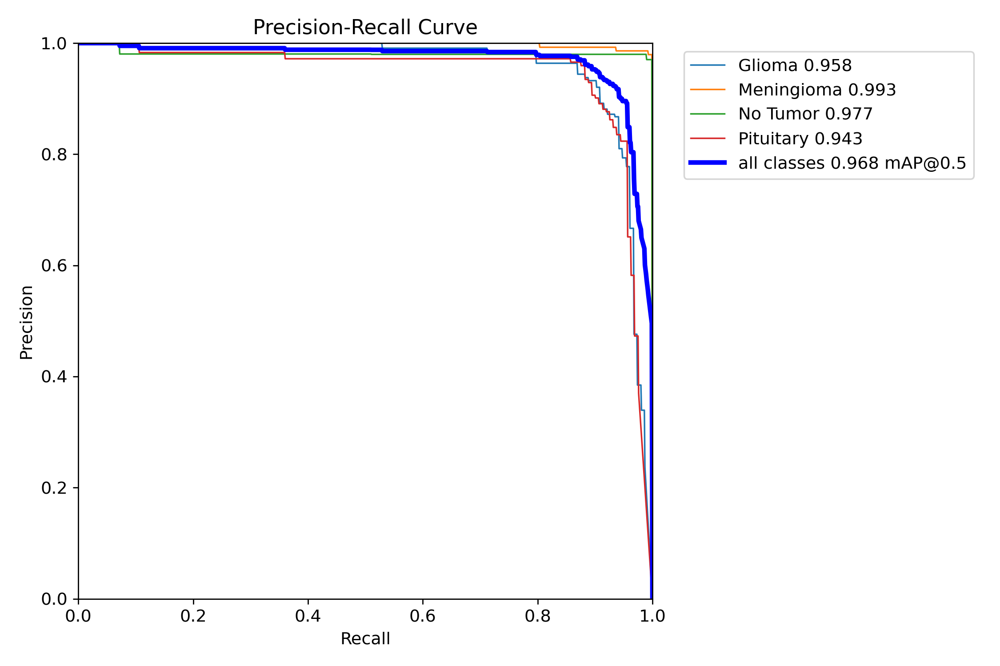

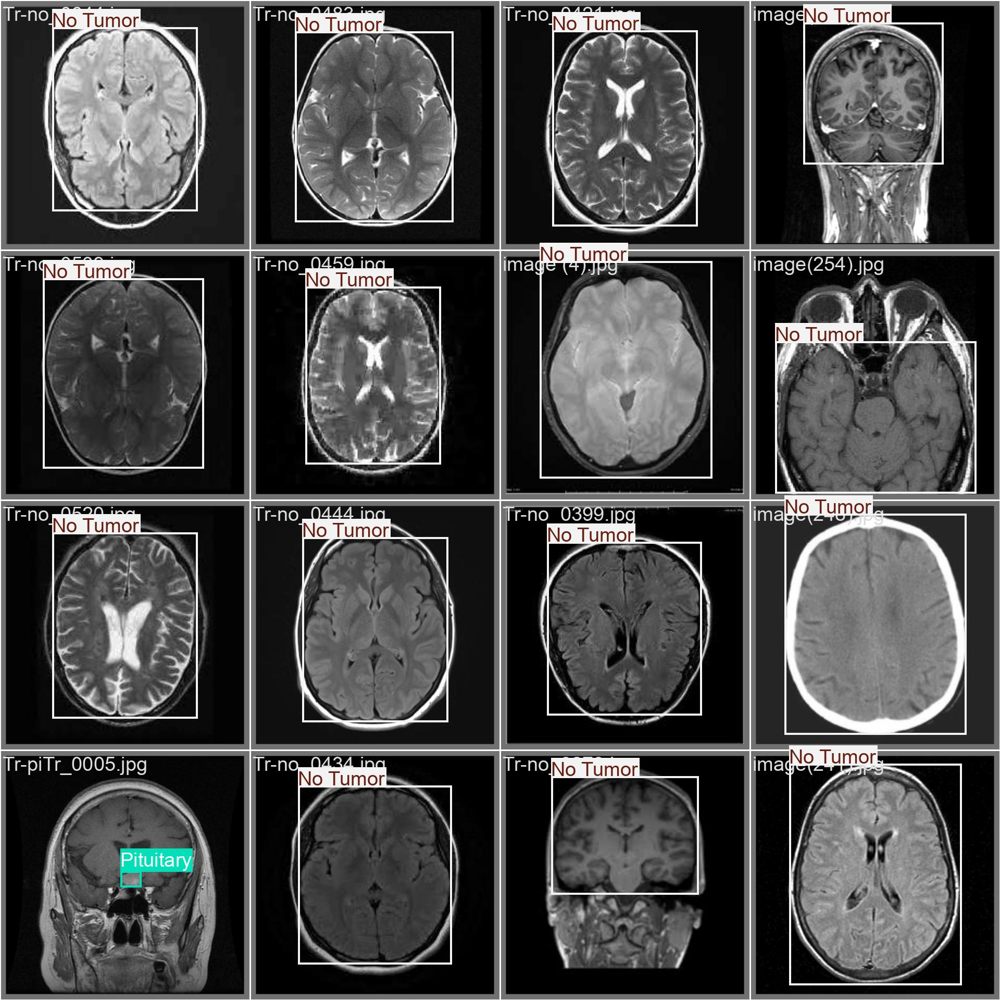

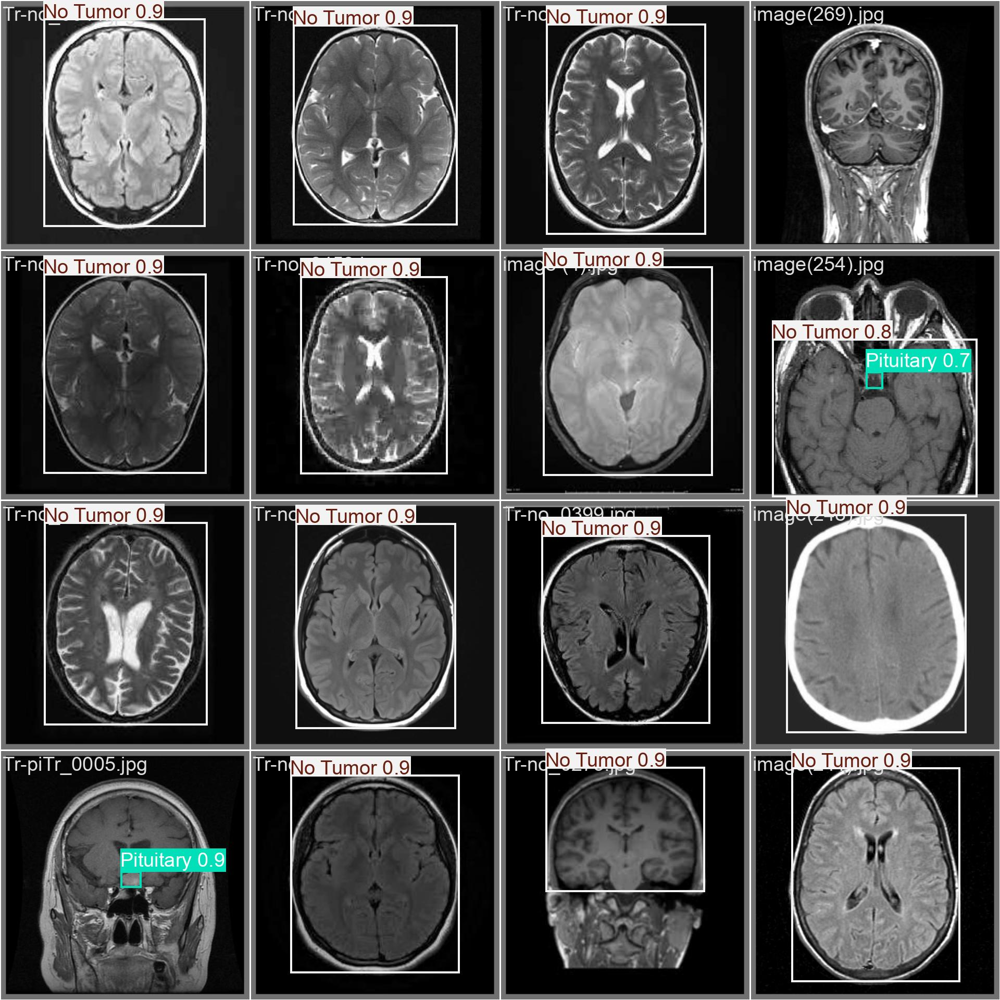

In [10]:
from IPython.display import Image,display
path='/kaggle/working/runs/detect/train'
image=[f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

for i in range(len(image)):
  display(Image(filename=path+'/'+image[i]))



0: 640x640 1 Glioma, 16.4ms
Speed: 1.9ms preprocess, 16.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


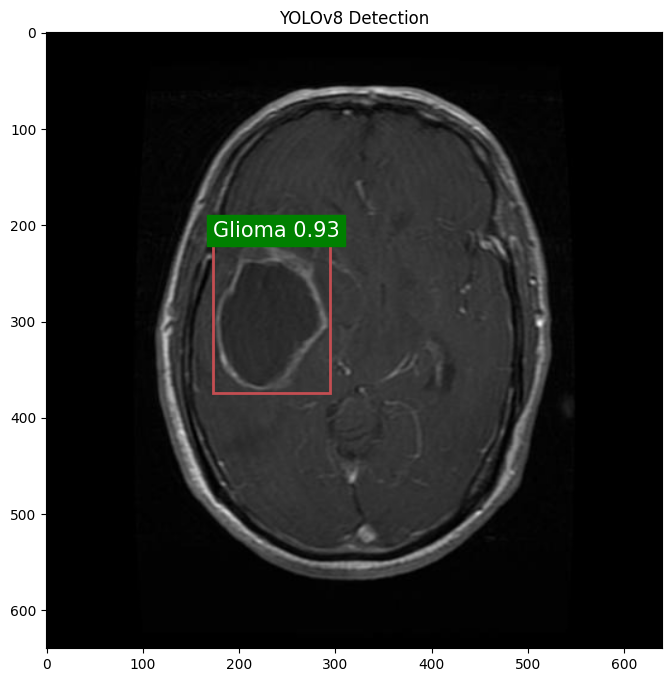


0: 640x640 1 Glioma, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


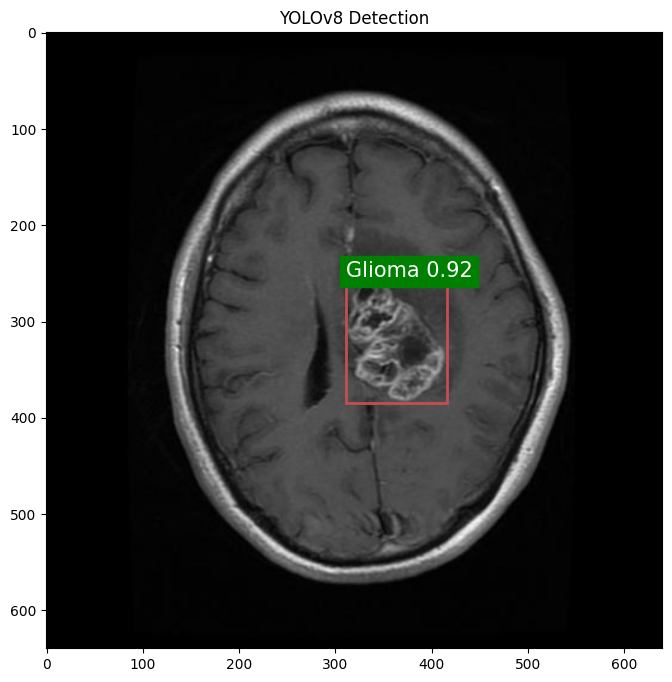


0: 640x640 1 Glioma, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


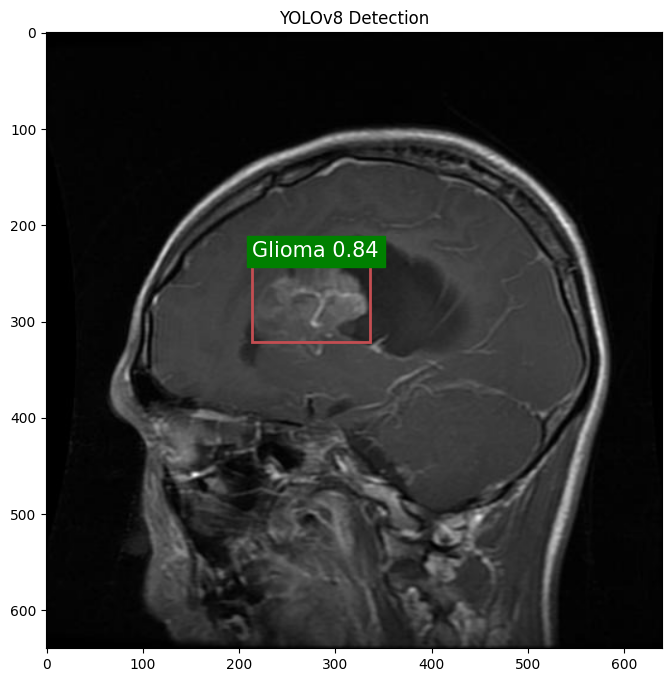


0: 640x640 1 Glioma, 1 Pituitary, 16.3ms
Speed: 1.8ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


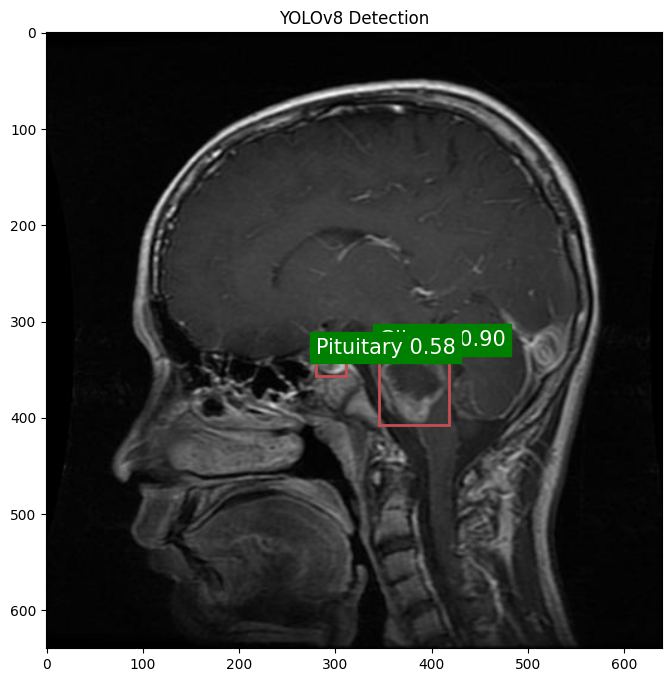


0: 640x640 1 Glioma, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


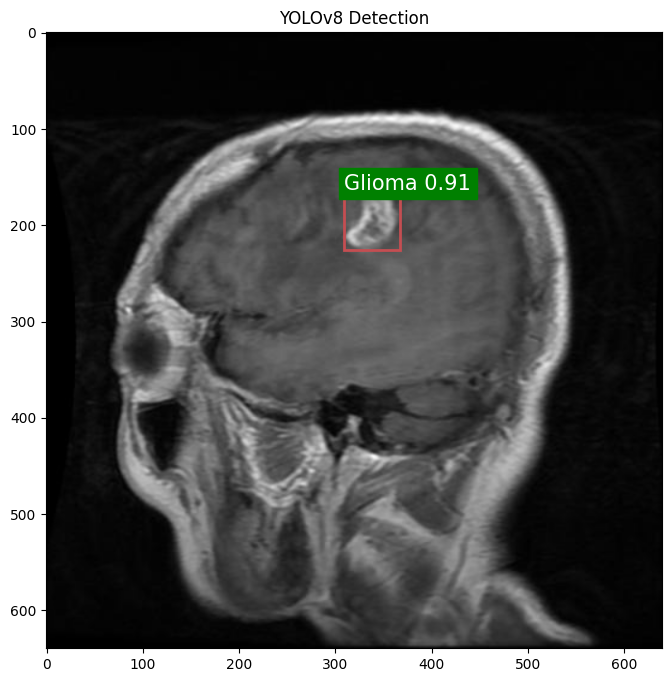


0: 640x640 1 Glioma, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


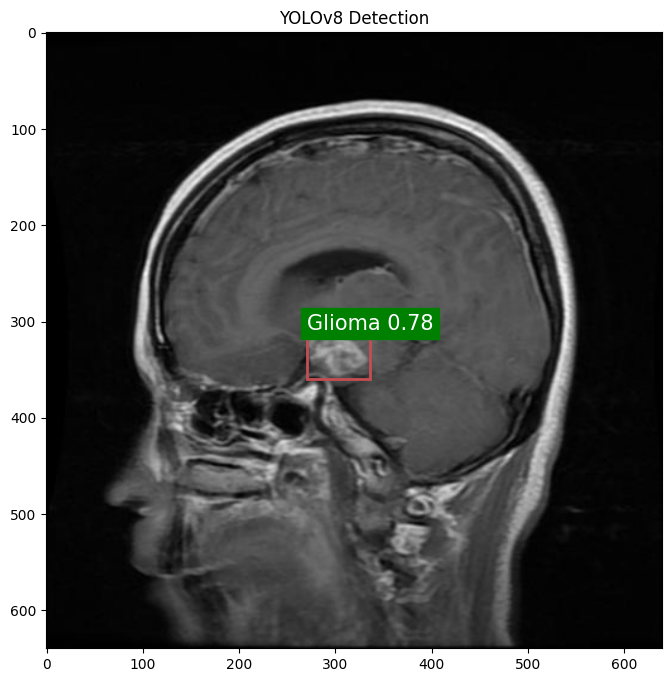


0: 640x640 1 Glioma, 16.3ms
Speed: 2.4ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


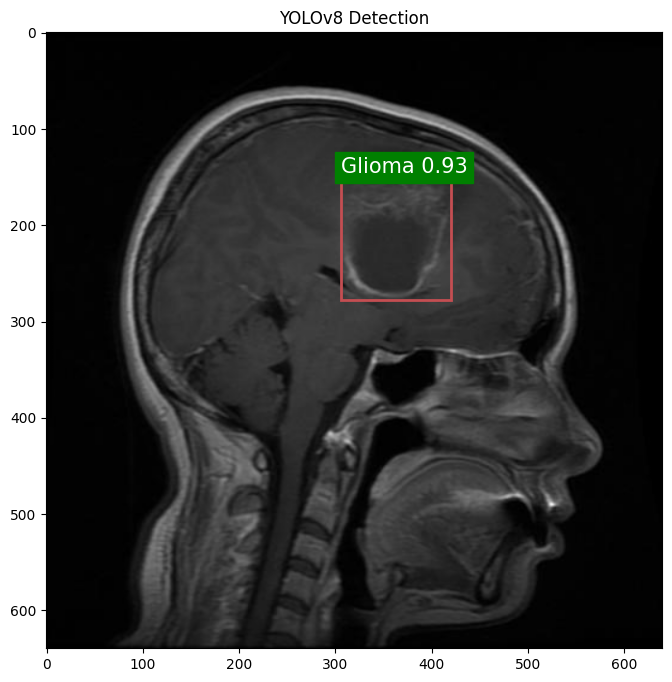


0: 640x640 1 Glioma, 16.3ms
Speed: 2.2ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


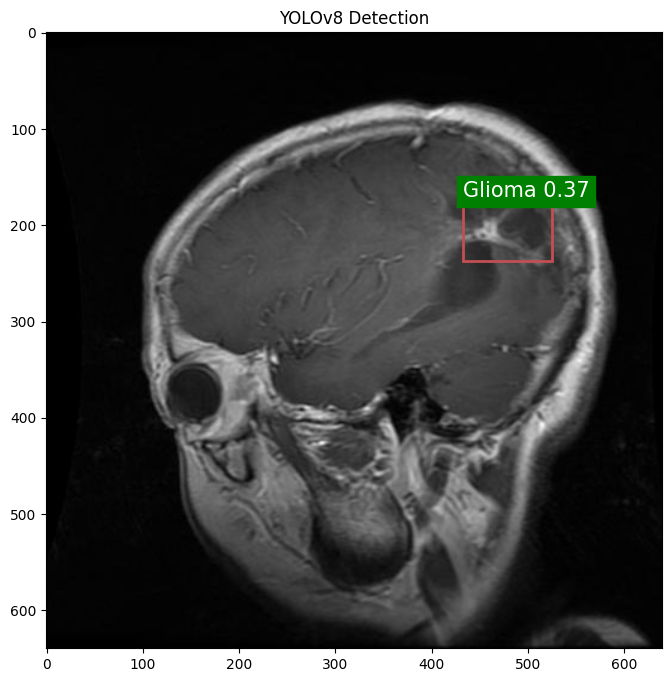


0: 640x640 1 Glioma, 1 Pituitary, 16.3ms
Speed: 2.4ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


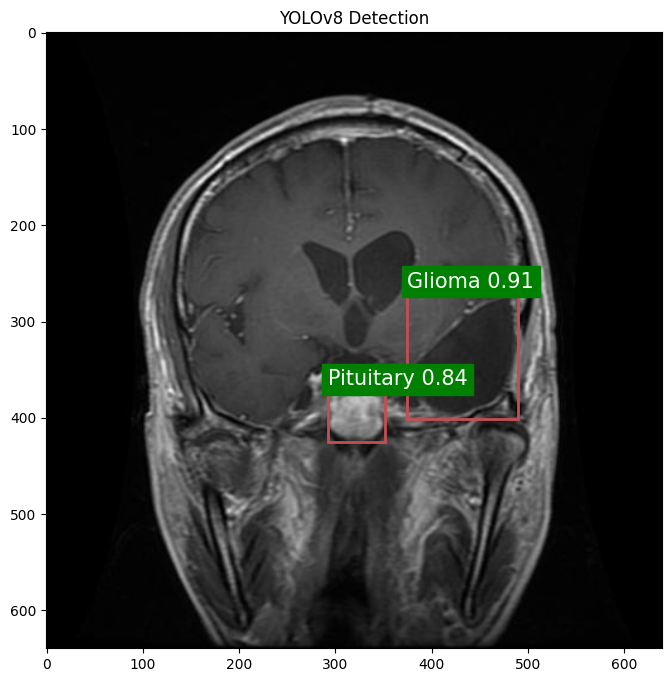


0: 640x640 1 Glioma, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


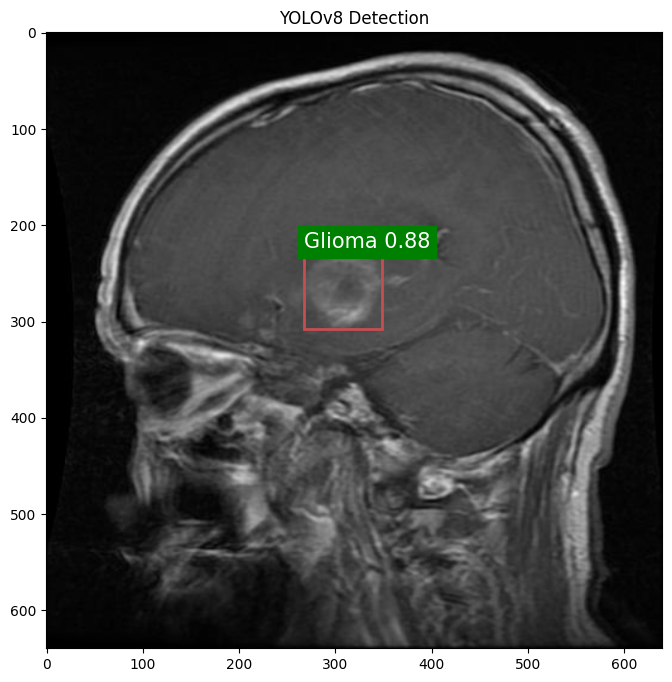


0: 640x640 2 Gliomas, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


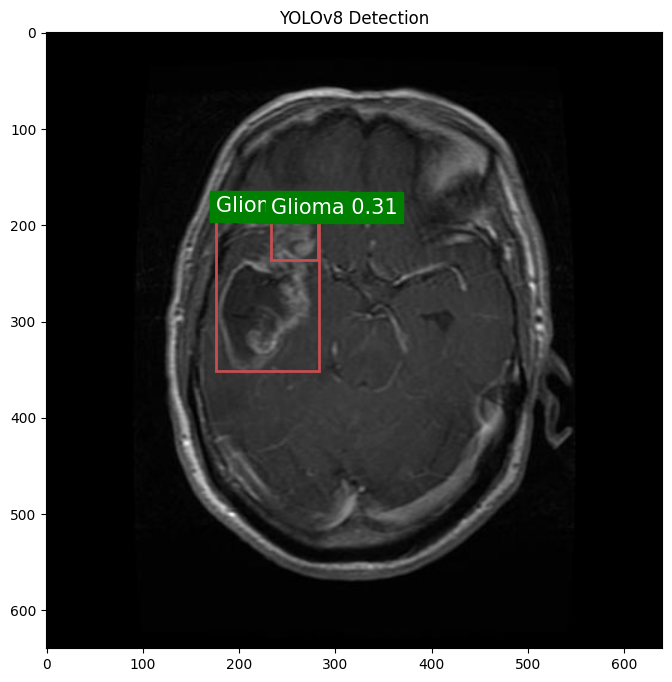


0: 640x640 1 Glioma, 16.3ms
Speed: 2.2ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


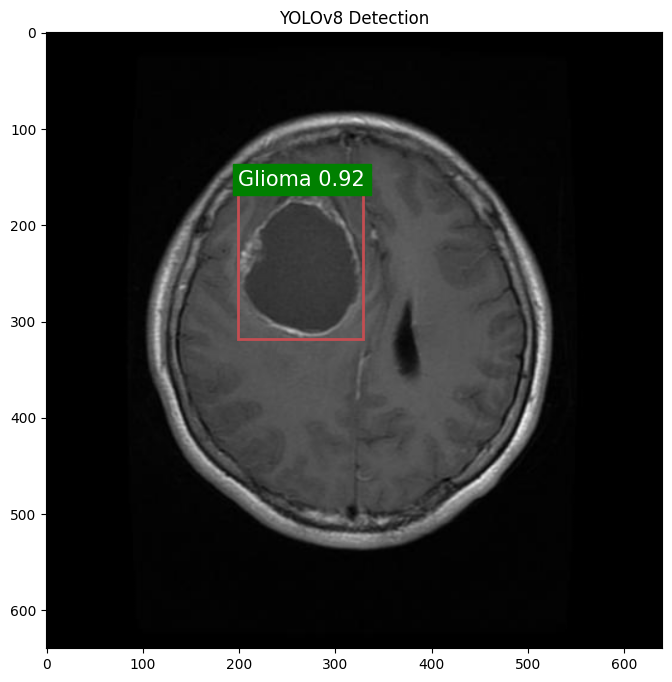


0: 640x640 1 Glioma, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


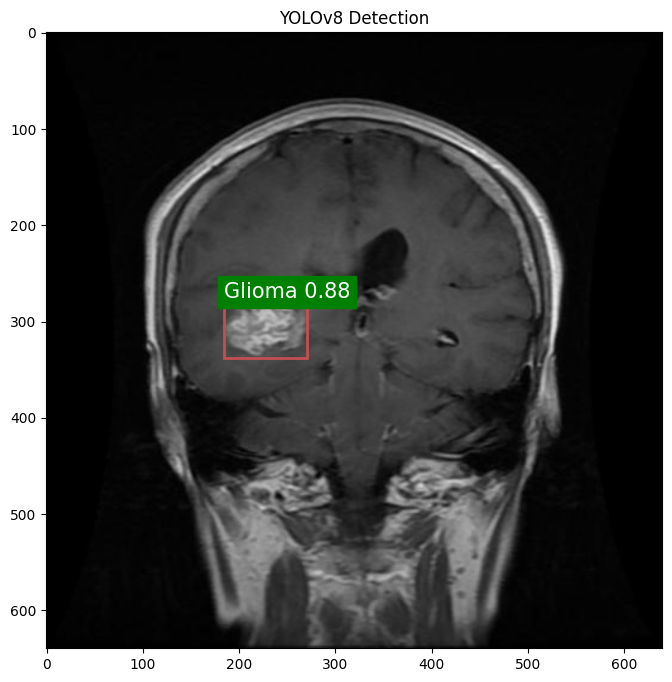


0: 640x640 1 Glioma, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


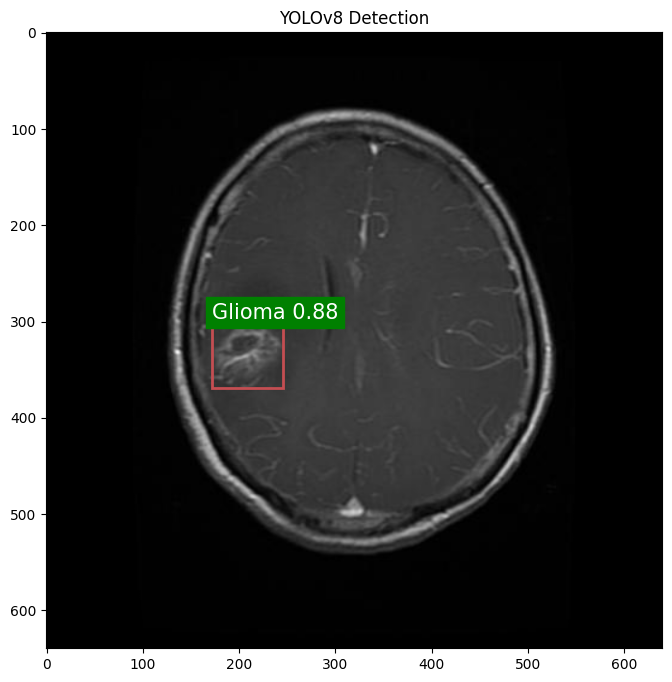


0: 640x640 1 Glioma, 16.4ms
Speed: 2.8ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


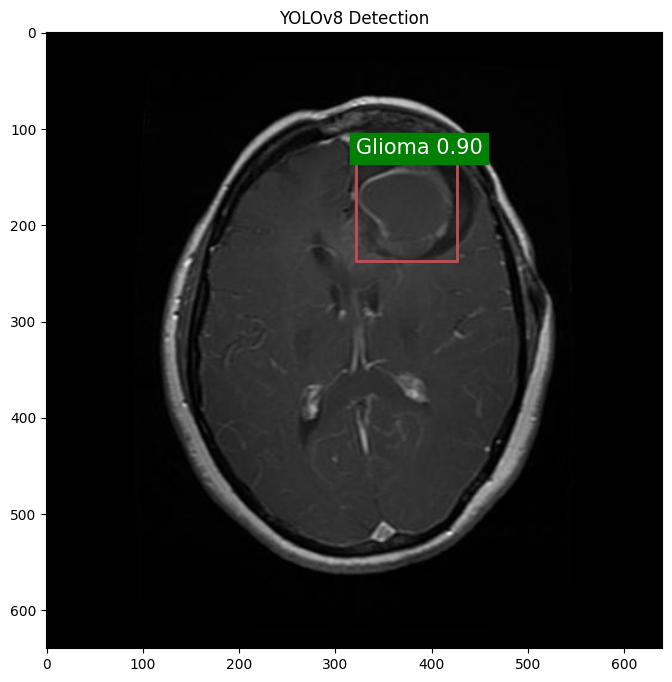


0: 640x640 1 Glioma, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


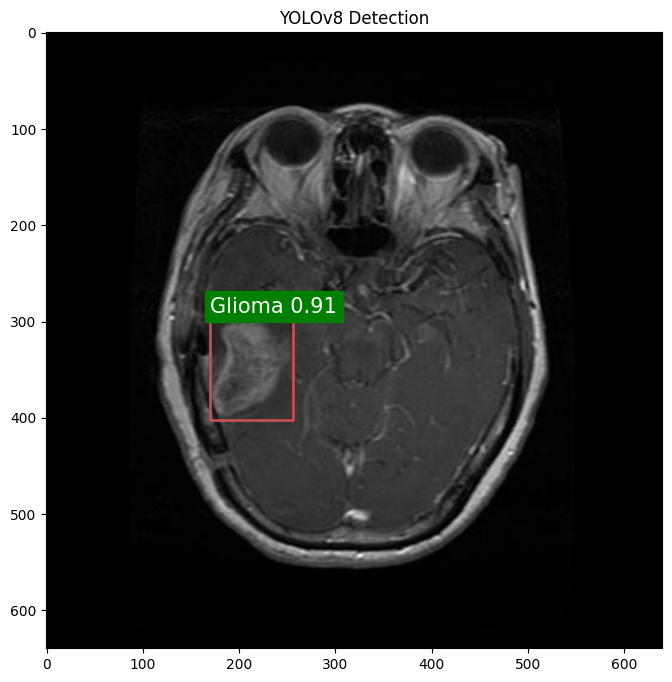


0: 640x640 1 Glioma, 16.3ms
Speed: 2.3ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


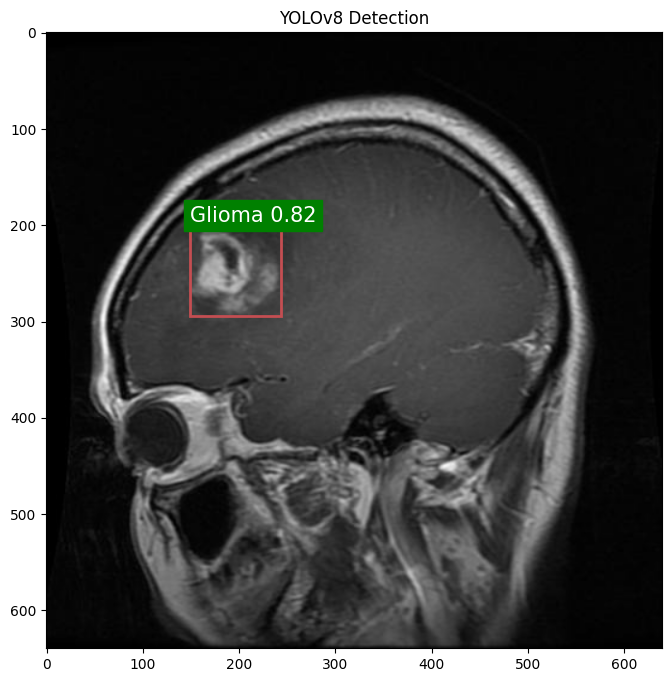


0: 640x640 1 Glioma, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


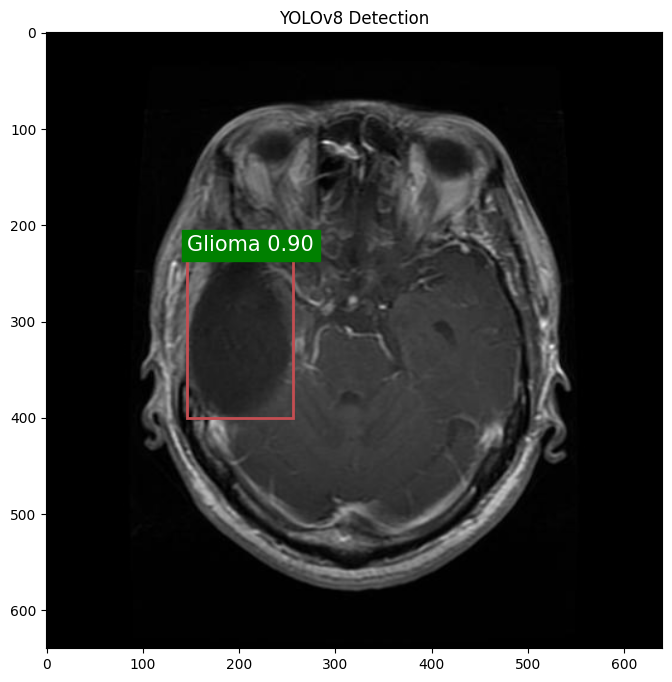


0: 640x640 1 Glioma, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


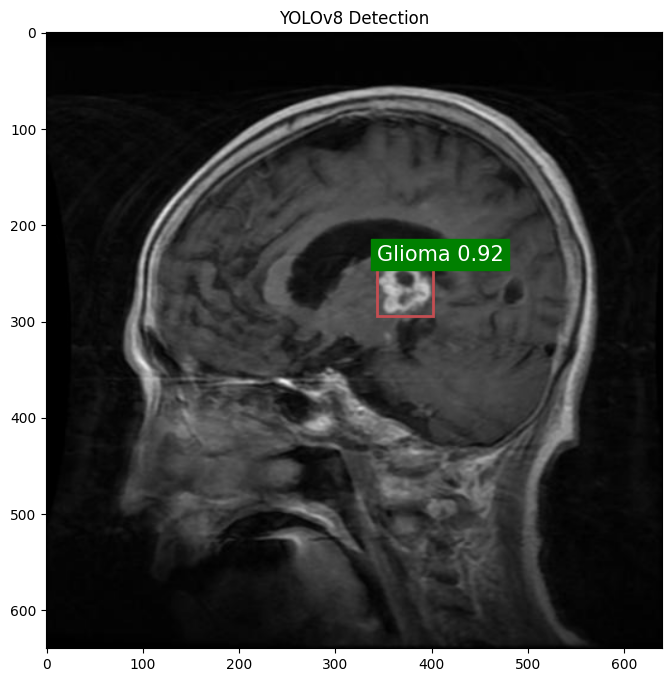


0: 640x640 1 Glioma, 16.4ms
Speed: 2.3ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


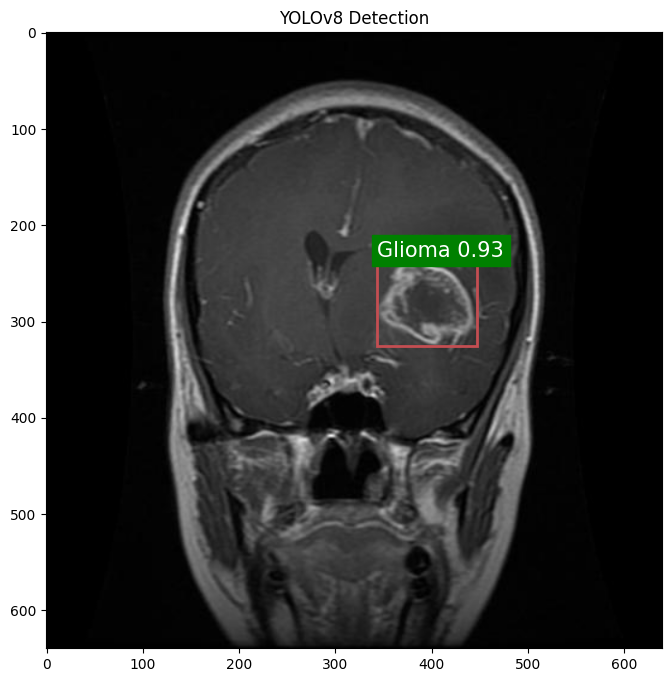


0: 640x640 1 Glioma, 16.4ms
Speed: 2.4ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


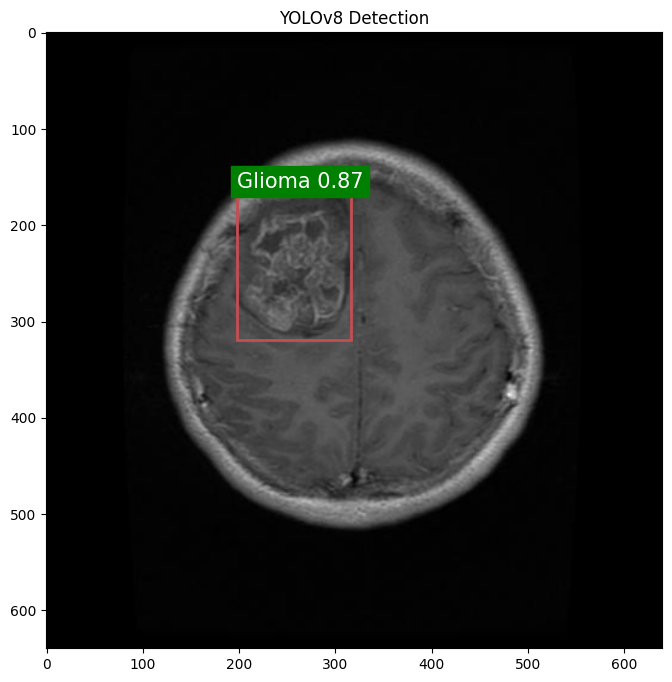


0: 640x640 1 Glioma, 16.4ms
Speed: 2.7ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


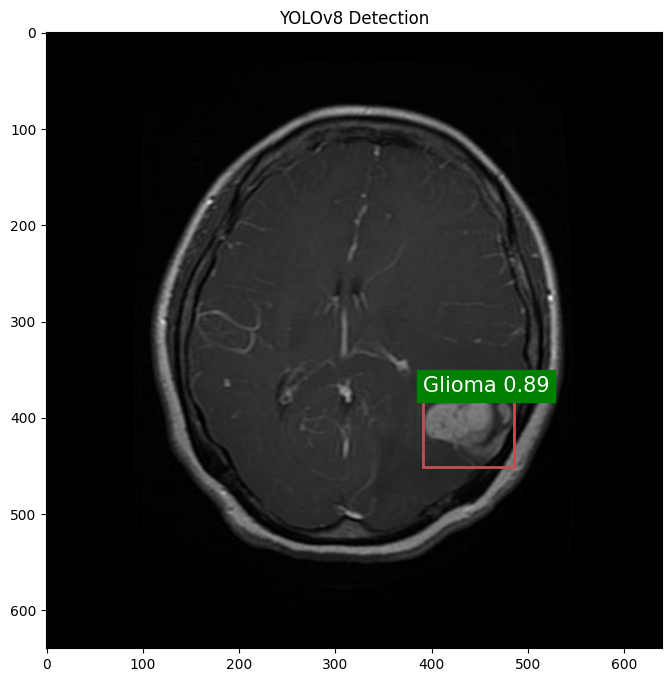


0: 640x640 1 Glioma, 16.3ms
Speed: 1.7ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


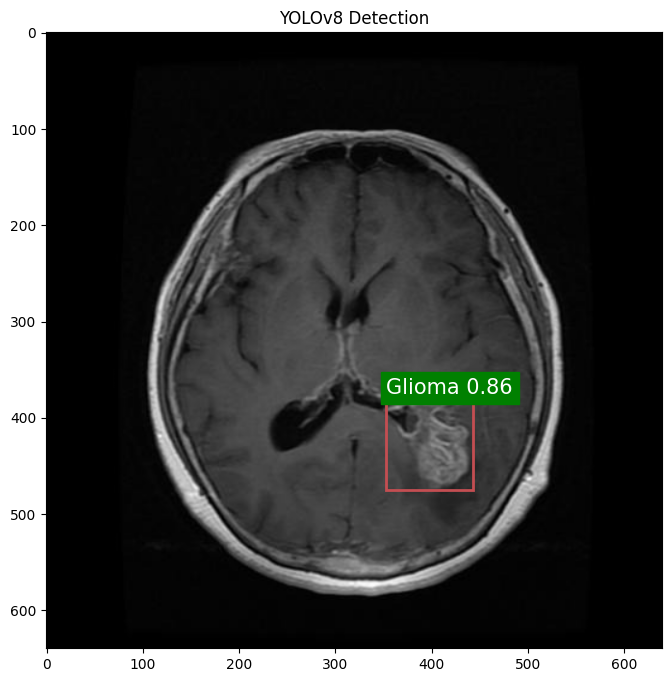


0: 640x640 1 Glioma, 16.3ms
Speed: 2.3ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


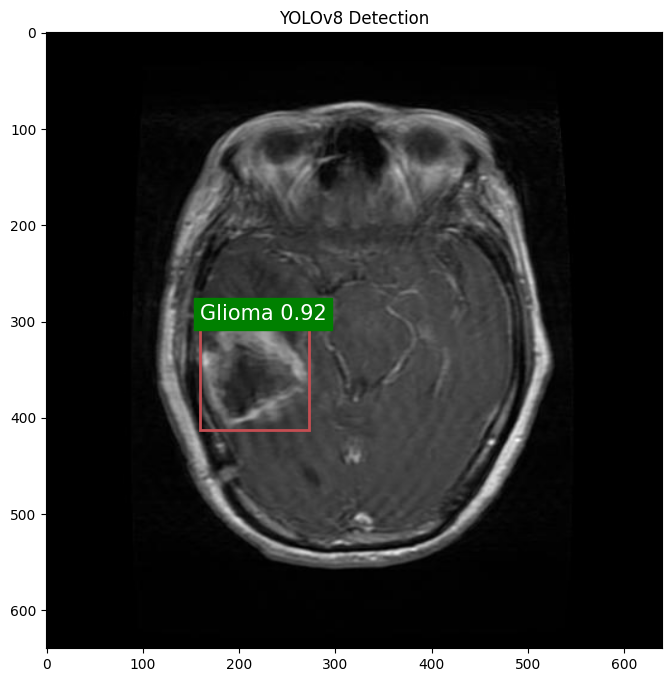


0: 640x640 1 Glioma, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


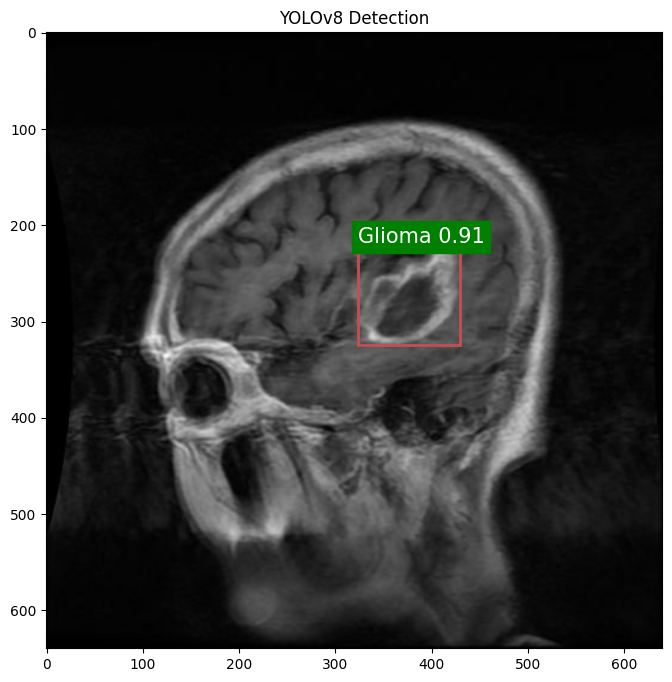


0: 640x640 4 Gliomas, 16.3ms
Speed: 1.8ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


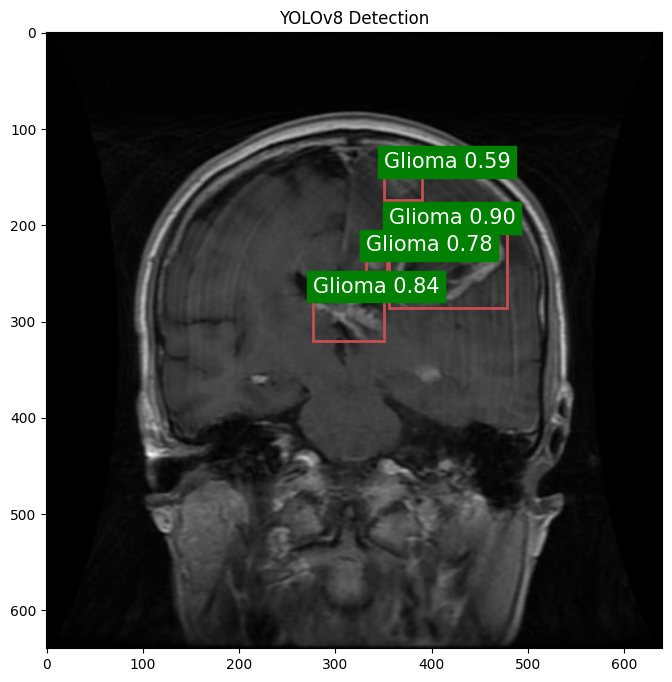


0: 640x640 2 Gliomas, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


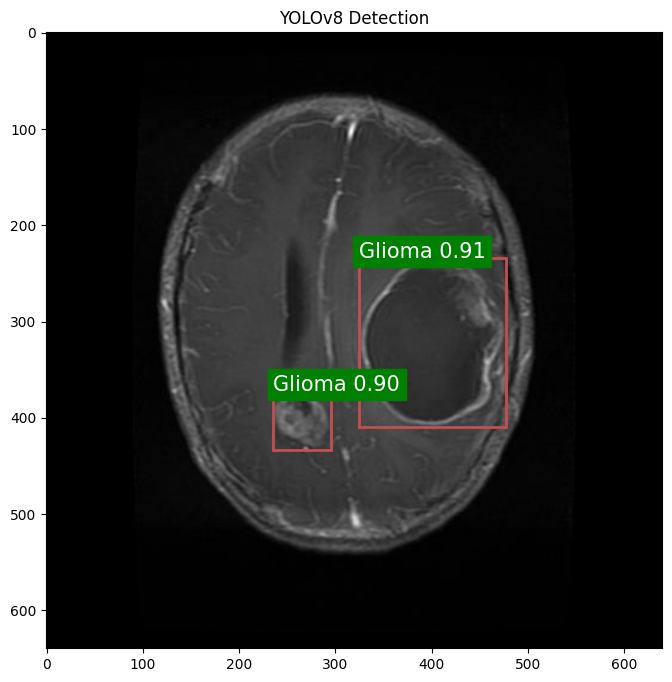


0: 640x640 1 Glioma, 16.3ms
Speed: 2.2ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


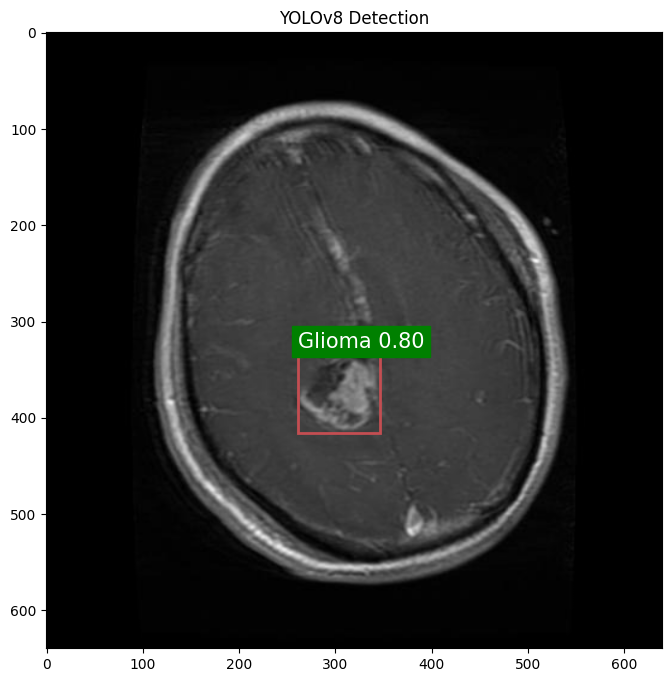


0: 640x640 1 Glioma, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


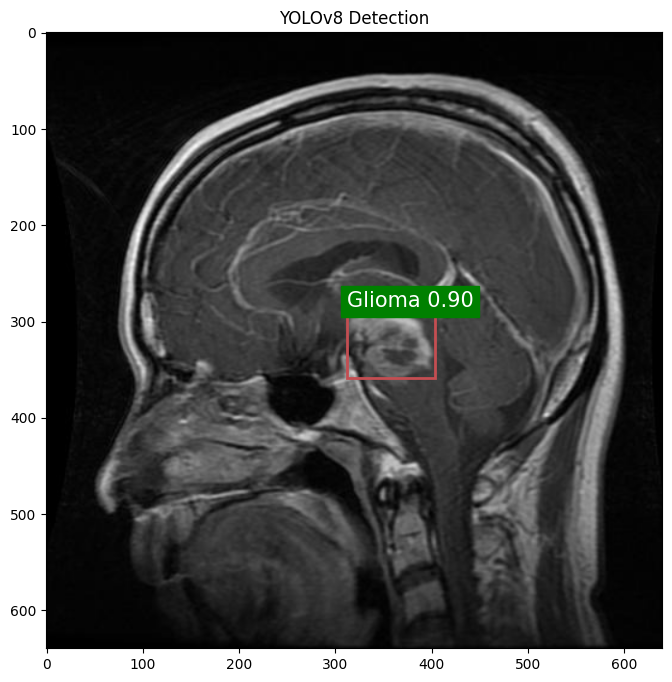


0: 640x640 1 Glioma, 1 Pituitary, 16.4ms
Speed: 2.2ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


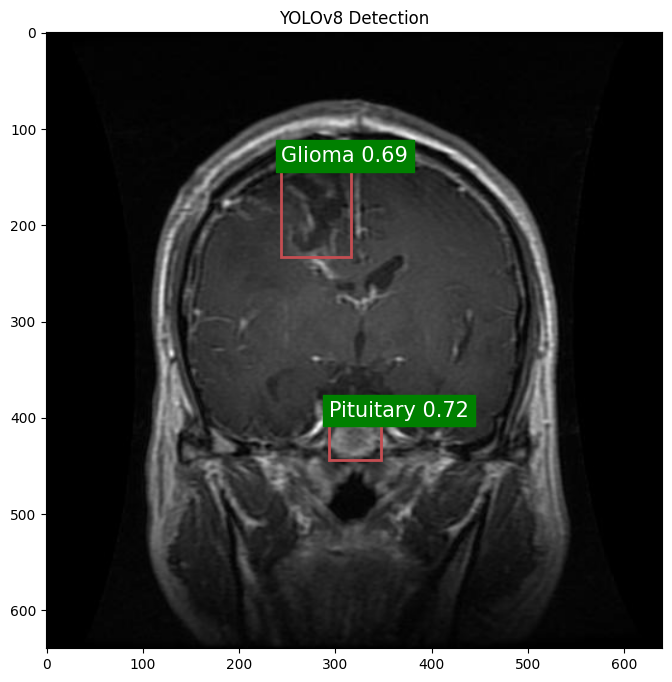


0: 640x640 2 Gliomas, 16.3ms
Speed: 1.7ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


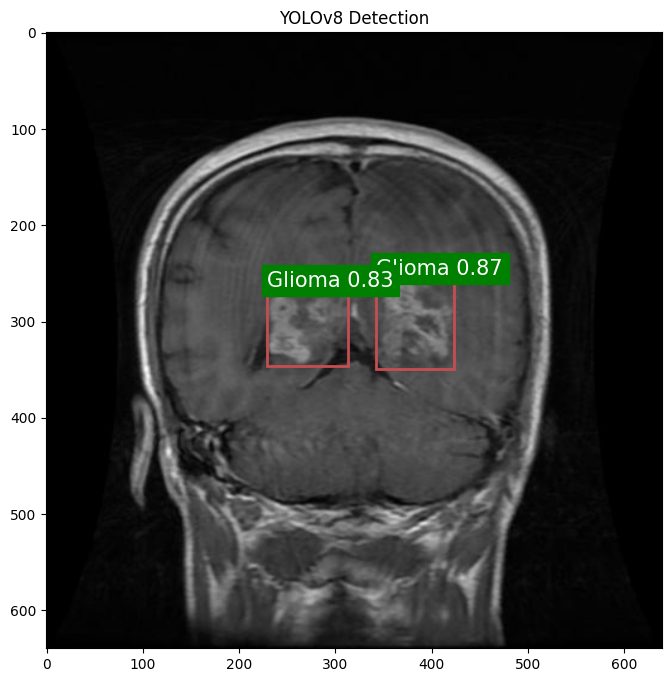


0: 640x640 1 Glioma, 1 Pituitary, 16.4ms
Speed: 2.5ms preprocess, 16.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


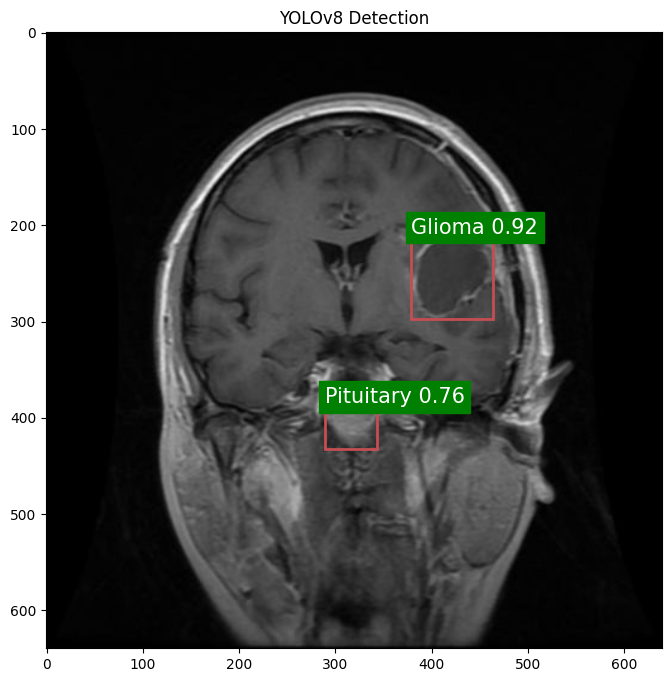


0: 640x640 1 Glioma, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


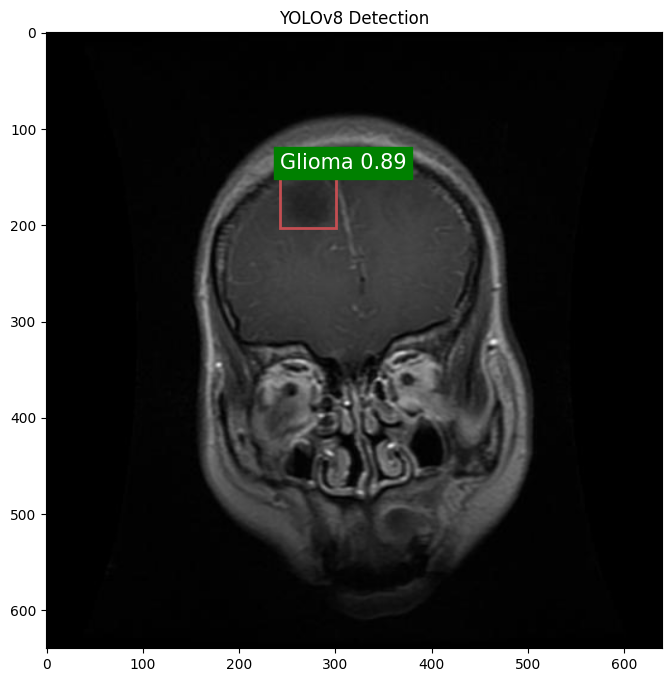


0: 640x640 5 Gliomas, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


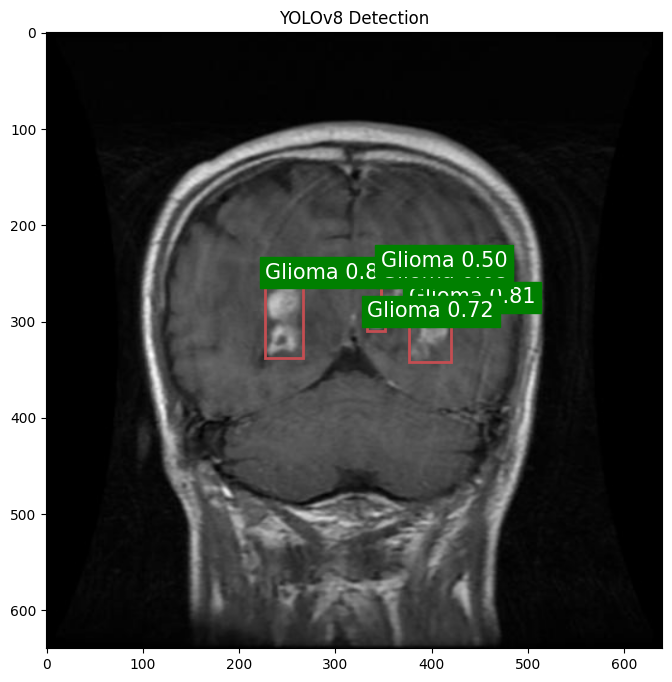


0: 640x640 1 Glioma, 16.3ms
Speed: 2.4ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


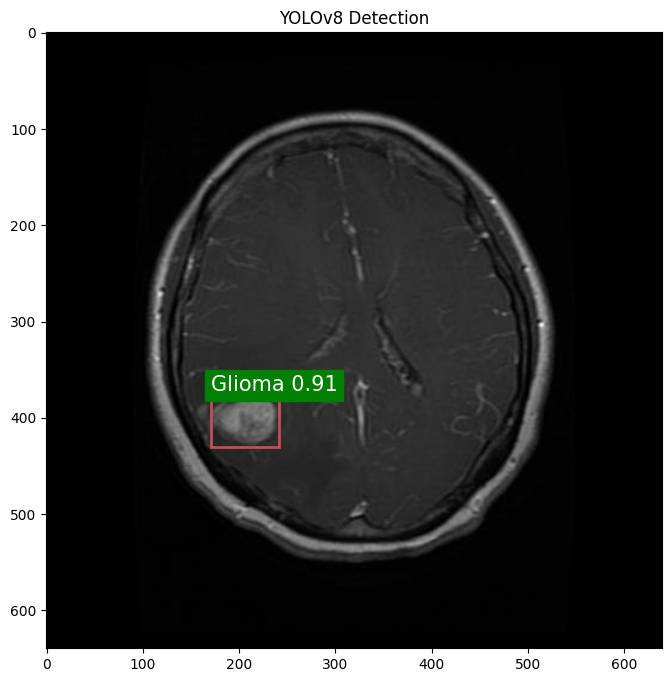

In [12]:
def display_pred(images, model):
    for i in range(35):
        img = images[i]
        result = model.predict(img)[0] 

        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        ax = plt.gca()

        for detection in result.boxes:
            x1, y1, x2, y2 = detection.xyxy[0].cpu().numpy()
            conf = detection.conf[0].cpu().numpy()
            cls = detection.cls[0].cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(x1, y1, f"{classes[int(cls)]} {conf:.2f}", color='white', fontsize=15, backgroundcolor='green')
        
        plt.title(f'YOLOv8 Detection')
        plt.show()
display_pred(val_images,model)

In [14]:
import os

print(os.listdir('runs/detect'))  # List contents of the 'runs/detect' directory


['train2', 'train']


In [15]:
print(os.listdir('runs/detect/train'))  # Replace 'train' with your specific folder name if needed


['train_batch2.jpg', 'F1_curve.png', 'val_batch2_pred.jpg', 'weights', 'train_batch7426.jpg', 'labels.jpg', 'results.csv', 'train_batch7427.jpg', 'val_batch2_labels.jpg', 'train_batch1.jpg', 'confusion_matrix.png', 'events.out.tfevents.1736826100.9d30da24de9f.40.0', 'train_batch0.jpg', 'val_batch0_labels.jpg', 'confusion_matrix_normalized.png', 'results.png', 'val_batch0_pred.jpg', 'labels_correlogram.jpg', 'R_curve.png', 'P_curve.png', 'train_batch7425.jpg', 'PR_curve.png', 'val_batch1_labels.jpg', 'val_batch1_pred.jpg', 'args.yaml']


In [17]:
source = 'runs/detect/<your_folder_name>/best.pt'  # Replace <your_folder_name> with the actual name


In [19]:
import shutil

# Define the source and destination paths
source = '/kaggle/working/yolov8s.pt'
destination = '/kaggle/working/best.pt'

# Copy the file to the destination
shutil.copy(source, destination)
print(f"Model saved to {destination}")


Model saved to /kaggle/working/best.pt
